# Investigation: Obvious FOV Rules

This notebook is designed to investigate a specific, "obvious" FOV to search for and visually validate spatial association rules. 

It provides a set of highly reusable methods to print FOV metadata, view the full FOV with all cell types, and investigate a highlighted rule.

## 1. Imports & Configuration

In [39]:
import pandas as pd
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FuncFormatter
import warnings
warnings.filterwarnings('ignore')

# Add root to path for utils
sys.path.append(os.path.abspath('../../'))

# --- Parameters ---
# Setup functional markers thresholds to align with other notebooks
USE_FUNCTIONAL_MARKERS = False
CELLTYPE_MARKER_THRESHOLDS = {
    'Epithelial': {'Ki67': 2.5, 'HLADRDPDQ': 1.75},
    'CD8T': {'Ki67': 2.5, 'CD103': 2.0, 'CD69': 2.0, 'GZMB': 2.5},
    'CD4T': {'Ki67': 1.0, 'CD103': 1.0, 'CD69': 2.0, 'GZMB': 0.5},
    'Neutrophil': {'CD103': 2.75},
    'Neutrophil_CD15': {'CD103': 2.75}
}

BANDWIDTH = 15
RADIUS= 25
MIN_CELLS_PER_PATCH = 2

RESULT_FPGROWTH = '../../results/full_run/fpgrowth/data/'
RESULT_WEIGHTED_FPGROWTH = '../../results/full_run/binary_CN_4_items_fixed_Epithelial/data/'
# RESULT_WEIGHTED_FPGROWTH = '../../results/full_run/weighted_fpgrowth/data/min_support_runs/weighted_fpgrowth_with_markers_2/data/'


## 2. Data Loading

In [40]:
def load_results(algo = 'fpgrowth'):
    print("Loading results metrics...")
    if algo == 'fpgrowth':
        RESULT_CSV_PATH = os.path.join(RESULT_FPGROWTH, 'results_CN.csv')
        RAW_RESULTS_CSV_PATH = os.path.join(RESULT_FPGROWTH, 'results_CN_RAW.csv')
    else:
        RESULT_CSV_PATH = os.path.join(RESULT_WEIGHTED_FPGROWTH, 'results_CN.csv')
        RAW_RESULTS_CSV_PATH = os.path.join(RESULT_WEIGHTED_FPGROWTH, 'results_CN_RAW.csv')

    if os.path.exists(RESULT_CSV_PATH):
        df_results = pd.read_csv(RESULT_CSV_PATH)
        print(f"Results loaded from {RESULT_CSV_PATH}")
        
    else:
        raise FileNotFoundError(f"Results file not found at {RESULT_CSV_PATH}")
    
    if os.path.exists(RAW_RESULTS_CSV_PATH):
        df_raw_results = pd.read_csv(RAW_RESULTS_CSV_PATH)
        print(f"Results loaded from {RAW_RESULTS_CSV_PATH}")
        
    else:
        # A run that kept only its filtered rules has no raw table to fall back on.
        df_raw_results = None
        print(f"No raw results at {RAW_RESULTS_CSV_PATH}; dropped rules cannot be looked up")
    return df_results, df_raw_results


In [41]:
def _add_functional_subtypes(df):
    if not USE_FUNCTIONAL_MARKERS:
        df["functional_subtypes"] = [[] for _ in range(len(df))]
        return df
    functional_subtypes_list = [[] for _ in range(len(df))]
    idx_to_pos = {idx: i for i, idx in enumerate(df.index)}
    for base_type, markers in CELLTYPE_MARKER_THRESHOLDS.items():
        type_mask = df["cell type"] == base_type
        for marker, threshold in markers.items():
            if marker in df.columns:
                mask = type_mask & (df[marker] > threshold)
                subtype_label = f"{base_type}_{marker}+"
                matching_indices = df.index[mask]
                for idx in matching_indices:
                    functional_subtypes_list[idx_to_pos[idx]].append(subtype_label)
    df["functional_subtypes"] = functional_subtypes_list
    return df

def get_organ(row):
    if pd.notna(row.get("Localization")): return row["Localization"]
    cohort = str(row.get("Cohort", ""))
    if "Colon" in cohort: return "Colon"
    if "Duodenum" in cohort: return "Duodenum"
    return "Unknown"

print("Loading datasets...")
def get_data_dir():
    # Find the data directory by walking up from the current directory
    current_dir = os.path.abspath(os.getcwd())
    while current_dir != os.path.dirname(current_dir):
        potential_data = os.path.join(current_dir, 'data', 'MIBIGutCsv')
        if os.path.exists(potential_data):
            return potential_data
        current_dir = os.path.dirname(current_dir)
    return '../../data/MIBIGutCsv'  # Fallback

data_dir = get_data_dir()
cell_table_path = os.path.join(data_dir, 'cell_table.csv')
fov_meta_path = os.path.join(data_dir, 'fovs_metadata.csv')
biopsy_meta_path = os.path.join(data_dir, 'biopsy_metadata.csv')

df_cells = pd.read_csv(cell_table_path)
df_fovs = pd.read_csv(fov_meta_path)
df_biopsy = pd.read_csv(biopsy_meta_path)

# Merge FOV with Biopsy to get score columns and Localization
df_fovs = pd.merge(
    df_fovs,
    df_biopsy[['Biopsy_ID', 'Pathological score', 'Clinical score', 'Localization']],
    left_on='Patient',
    right_on='Biopsy_ID',
    how='left'
)
df_fovs["Organ"] = df_fovs.apply(get_organ, axis=1)

# Normalize Coordinates
fov_to_size = df_fovs.set_index('FOV')['Size [um]'].to_dict()
def normalize_coords(row):
    size = fov_to_size.get(row['fov'], 800)
    res = 1024 if size == 400 else 2048
    return row['centroid_x'] * (size / res), row['centroid_y'] * (size / res)

print("Normalizing coordinates...")
df_cells[['x_um', 'y_um']] = df_cells.apply(lambda row: pd.Series(normalize_coords(row)), axis=1)

print("Adding functional subtypes...")
df_cells = _add_functional_subtypes(df_cells)

print(f"Total Cells Loaded: {len(df_cells)}")


Loading datasets...
Normalizing coordinates...
Adding functional subtypes...
Total Cells Loaded: 713372


In [42]:
result_fpgrowth, result_fpgrowth_raw = load_results('fpgrowth')
result_weighted_fpgrowth, result_weighted_fpgrowth_raw = load_results('weighted_fpgrowth')


Loading results metrics...
Results loaded from ../../results/full_run/fpgrowth/data/results_CN.csv
Results loaded from ../../results/full_run/fpgrowth/data/results_CN_RAW.csv
Loading results metrics...
Results loaded from ../../results/full_run/weighted_fpgrowth/data/results_CN.csv
Results loaded from ../../results/full_run/weighted_fpgrowth/data/results_CN_RAW.csv


## 3. Reusable Methods (Metadata & Plotting)
These functions handle the printing of standard FOV metadata and the generation of spatial plots (either full FOV or highlighting specific rules).

In [43]:
# Generate Global Colormap
all_types = sorted(df_cells["cell type"].dropna().astype(str).unique())
try:
    palette = plt.colormaps.get_cmap("tab20b").resampled(max(len(all_types), 1))
except AttributeError:
    palette = plt.cm.get_cmap("tab20b", max(len(all_types), 1))
CELL_COLOR_MAP = {ct: palette(i) for i, ct in enumerate(all_types)}
OTHER_COLOR = (0.5, 0.5, 0.5)

def add_scale_bar_50um(ax, x_max, y_max):
    # Data is already in um, so 50um is just 50 units.
    bar_um = 50.0
    x_end = x_max - 25
    x_start = x_end - bar_um
    y_line = y_max - 25
    ax.plot([x_start, x_end], [y_line, y_line], color="black", linewidth=4, solid_capstyle="butt")
    ax.text((x_start + x_end) / 2, y_line - 12, "50 µm", color="black", ha="center", va="bottom", fontsize=10)


def plot_fov(fov_id, df_cells_all, df_fovs_all, target_cells=None, ax=None):
    """
    Plots an FOV.
    - If target_cells is None: Plots all cells in the FOV normally.
    - If target_cells is provided: Grays out background cells and highlights targets using their original colors.
    """
    df_fov = df_cells_all[df_cells_all["fov"] == fov_id].copy()
    if df_fov.empty:
        print(f"No cells found for FOV {fov_id}")
        return
    
    size_um = df_fovs_all[df_fovs_all['FOV'] == fov_id]['Size [um]'].iloc[0] if not df_fovs_all[df_fovs_all['FOV'] == fov_id].empty else 400
    
    if size_um == 400:
        cell_size = 90
    else:
        cell_size = 45

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 10), facecolor="#ffffff")
        show_plot = True
    else:     
        show_plot = False

    ax.set_facecolor("#eaeaeaff")
    
    # --- Conditional Plotting Logic ---
    if target_cells:
        title = f"Highlighted Rule in {fov_id}\n{', '.join(target_cells)}"
        
        # Plot 'Other' cells first (background)
        other_mask = ~df_fov['cell type'].isin(target_cells)
        if other_mask.any():
            g = df_fov[other_mask]
            ax.scatter(g["x_um"], g["y_um"], s=cell_size, c=[OTHER_COLOR], alpha=0.3, linewidths=0, label='Other')
            
        # Plot target cells grouped by type on top
        target_mask = df_fov['cell type'].isin(target_cells)
        if target_mask.any():
            for ct, g in df_fov[target_mask].groupby("cell type"):
                color = CELL_COLOR_MAP.get(ct, (0, 0, 0))
                # Plot halo
                # ax.scatter(g["x_um"], g["y_um"], s=40, c=[color], alpha=0.2, linewidths=0)
                # Plot center
                ax.scatter(g["x_um"], g["y_um"], s=cell_size, c=[color], label=ct, alpha=0.9, linewidths=0)
                
        # Legend only for the highlighted cells
        handles = [plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=CELL_COLOR_MAP.get(ct, 'black'), markeredgecolor="none", markersize=8, label=ct) for ct in target_cells]
        
    else:
        title = f"Full FOV: {fov_id}"
        # Plot all cells normally
        for ct, g in df_fov.groupby("cell type"):
            color = CELL_COLOR_MAP.get(ct, (1, 1, 1))
            # ax.scatter(g["x_um"], g["y_um"], s=40, c=[color], alpha=0.2, linewidths=0)
            ax.scatter(g["x_um"], g["y_um"], s=cell_size, c=[color], label=ct, alpha=0.9, linewidths=0)
            
        # Legend for all cell types present in this specific FOV
        present_types = sorted(df_fov["cell type"].dropna().astype(str).unique())
        handles = [plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=CELL_COLOR_MAP.get(ct, 'black'), markeredgecolor="none", markersize=8, label=ct) for ct in present_types]

    # --- Grids and Scaling ---
    x_max, y_max = df_fov["x_um"].max(), df_fov["y_um"].max()
    grid_spacing = 25.0 # 50 um grid
    ax.set_axisbelow(True)
    ax.xaxis.set_major_locator(MultipleLocator(100.0))
    ax.yaxis.set_major_locator(MultipleLocator(100.0))

    ax.xaxis.set_minor_locator(MultipleLocator(grid_spacing))
    ax.yaxis.set_minor_locator(MultipleLocator(grid_spacing))
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.8, alpha=0.7)
    ax.grid(which="major", color="lightgray", linestyle="-", linewidth=0.8, alpha=0.8)

    
    if not pd.isna(x_max) and not pd.isna(y_max):
        add_scale_bar_50um(ax, x_max=x_max, y_max=y_max)

    ax.set_title(title, color="black", fontsize=14)
    ax.set_xlabel("x (µm)", color="black")
    ax.set_ylabel("y (µm)", color="black")
    ax.set_aspect("equal", adjustable="box")
    ax.invert_yaxis()
    ax.tick_params(axis="both", colors="black", labelsize=9)
    for spine in ax.spines.values(): spine.set_visible(False)

    ax.legend(handles=handles, title="Cell type", bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=9, title_fontsize=10, frameon=True)
    
    if show_plot:
        plt.tight_layout()
        plt.show()


In [44]:
def print_fov_metadata(fov_id):
    """Prints metadata and (optionally) cell counts for a specific FOV."""
    fov_metadata = df_fovs[df_fovs['FOV'] == fov_id]
    if fov_metadata.empty:
        print(f"Error: FOV '{fov_id}' not found in metadata.")
        return
        
    meta = fov_metadata.iloc[0].to_dict()
    print("=" * 50)
    print(f"METADATA FOR FOV: {fov_id}")
    print("=" * 50)
    print(f"Cohort             : {meta.get('Cohort', 'Unknown')}")
    print(f"Patient / Biopsy ID: {meta.get('Patient', 'Unknown')}")
    print(f"Organ              : {meta.get('Organ', 'Unknown')}")
    print(f"Pathological Score : {meta.get('Pathological score', 'Unknown')}")
    print(f"Clinical Score     : {meta.get('Clinical score', 'Unknown')}")
    print(f"Size [um]          : {meta.get('Size [um]', 'Unknown')}")
    
    # Print targeted cell counts if requested
    if df_cells is not None:
        df_fov = df_cells[df_cells["fov"] == fov_id]
        total_cells = len(df_fov)
        print("-" * 50)
        print(f"Total Cells in FOV {fov_id}: {total_cells}")
    print("=" * 50)


In [45]:
def plot_fov_plus_rule_fovs(target_fov, target_lists=()):
    num_plots = 1 + len(target_lists)
    fig, axes = plt.subplots(1, num_plots, figsize=(10 * num_plots, 10), facecolor="#ffffff")

    # plot full fov
    plot_fov(target_fov, df_cells, df_fovs, target_cells=None, ax=axes[0])
    for i, target_cells in enumerate(target_lists):
        plot_fov(target_fov, df_cells, df_fovs, target_cells=target_cells, ax=axes[i+1])
    
    for i, ax in enumerate(axes):
        letter = chr(65 + i)  # 'A', 'B', 'C', ...
        ax.text(-0.05, 1.05, letter,
                transform=ax.transAxes, # IMPORTANT: This tells Matplotlib to use Axes coordinates (0 to 1) instead of your data's x/y coordinates
                fontsize=20, fontweight='bold', va='top', ha='right')
    plt.tight_layout()
    plt.show() 


In [46]:
def print_rule_cell_counts(cell_a, cell_b, target_fov):
    df_fov = df_cells[df_cells["fov"] == target_fov]
    count_a = (df_fov['cell type'] == cell_a).sum()
    count_b = (df_fov['cell type'] == cell_b).sum()
    print(f"=== Cell counts in FOV {target_fov}: ===")
    print(f"  {cell_a}: {count_a}")
    print(f"  {cell_b}: {count_b}")
    print(f"All cell counts: {len(df_fov)}")

In [47]:
import ast


def print_rule_metrics(cell_a, cell_b, target_fov, df_results, df_raw_results):
    """Prints support, confidence, and lift for a given cell pair from the results dataframe."""
    
    
    def check_condition(x, target_value):
        x = ast.literal_eval(x)
        return isinstance(x, list) and len(x) == 1 and x[0] == target_value
    
    def find_rule_row(antecedent_cell, consequent_cell, df_results):
        rule_row_a = df_results[
            (df_results['Antecedents'].apply(lambda x: check_condition(x, f"{antecedent_cell}_CENTER"))) & 
            (df_results['Consequents'].apply(lambda x: check_condition(x, f"{consequent_cell}_NEIGHBOR")))
        ]

        rule_row_b = df_results[
            (df_results['Antecedents'].apply(lambda x: check_condition(x, f"{consequent_cell}_CENTER"))) & 
            (df_results['Consequents'].apply(lambda x: check_condition(x, f"{antecedent_cell}_NEIGHBOR")))
        ]

        return rule_row_a, rule_row_b

    def print_metrics(rule_row):
        if rule_row is None or rule_row.empty:
            print("     No rule found for this cell pair in the specified FOV.")
            return False
        support = rule_row['Support'].values[0]
        confidence = rule_row['Confidence'].values[0]
        lift = rule_row['Lift'].values[0]
        conviction = rule_row['Conviction'].values[0]
        # Older runs call it FDR, newer ones Individual_FDR.
        fdr_column = 'Individual_FDR' if 'Individual_FDR' in rule_row else 'FDR'
        fdr = rule_row[fdr_column].values[0]
        
        print(f"Metrics for Rule:")
        print(f"Support   : {support:.4f}")
        print(f"Confidence: {confidence:.4f}")
        print(f"Lift      : {lift:.4f}")
        print(f"Conviction: {conviction:.4f}")
        print(f"FDR       : {fdr:.4f}")
        if 'Rule_Count_Global' in rule_row:
            print(f"Rule Count (Global): {rule_row['Rule_Count_Global'].values[0]}")

        return True

    df_fov_results = df_results[df_results['FOV'] == target_fov]
    df_fov_raw_results = (None if df_raw_results is None
                          else df_raw_results[df_raw_results['FOV'] == target_fov])
    
    rule_row_a, rule_row_b = find_rule_row(cell_a, cell_b, df_fov_results)
    rule_row_a_raw, rule_row_b_raw = ((None, None) if df_fov_raw_results is None
                                     else find_rule_row(cell_a, cell_b, df_fov_raw_results))

    print(f"--- Metrics for {cell_a} -> {cell_b} ---")
    is_found_a = print_metrics(rule_row_a)

    if not is_found_a:
        print(f"No rule found for {cell_a} -> {cell_b} in FOV {target_fov}. Checking raw results...")
        print_metrics(rule_row_a_raw)

        print("*" * 10)

    print(f"--- Metrics for {cell_b} -> {cell_a} ---")
    is_found_b = print_metrics(rule_row_b)

    if not is_found_b:
        print(f"No rule found for {cell_b} -> {cell_a} in FOV {target_fov}. Checking raw results...")
        print_metrics(rule_row_b_raw)
        print("*" * 10)

In [48]:
from sklearn.neighbors import NearestNeighbors

# --- self-contained helpers (this notebook studies marker rules, which the pipeline no longer builds) ---
def build_cell_item_token(cell_type, subtypes, suffix=None):
    """One label per cell: type plus any markers, e.g. 'CD8T_CD103+_CENTER'."""
    base = str(cell_type)
    markers = sorted({str(s)[len(base) + 1:] if str(s).startswith(base + "_") else str(s)
                      for s in (subtypes if subtypes is not None else [])})
    core = f"{base}_{'_'.join(markers)}" if markers else base
    return f"{core}_{suffix}" if suffix else core


def _extract_base_lineage(item):
    """'Neutrophil_CD15_Ki67+_NEIGHBOR' -> 'Neutrophil_CD15'."""
    clean = item.replace("_CENTER", "").replace("_NEIGHBOR", "")
    if "+" not in clean:
        return clean
    parts = [p for p in clean.split("_") if "+" not in p]
    return "_".join(parts) if parts else clean


def passes_rule_support_policy(config, support, sup_ant, sup_con, confidence, lift, num_transactions):
    """Avoidance waives joint support; high confidence earns a lower floor."""
    floor = float(config.get("MIN_ABS_SUPPORT", 0)) / float(num_transactions)
    if lift < 1.0:
        return sup_ant >= floor and sup_con >= floor
    needed = config.get("HIGH_CONF_MIN_SUPPORT", config["MIN_SUPPORT"]) \
        if confidence >= config.get("HIGH_CONFIDENCE_THRESHOLD", 1.01) else config["MIN_SUPPORT"]
    return support >= max(needed, floor)

def _parse_token(token, suffix):
    token = str(token)
    tail = f"_{suffix}"
    if not token.endswith(tail):
        return None, set()
    core = token[:-len(tail)]
    base = _extract_base_lineage(core)
    markers = {part for part in core.split('_') if part.endswith('+')}
    return base, markers

def _matches_rule_item(token, base, suffix, required_markers=()):
        token_base, token_markers = _parse_token(token, suffix)
        if token_base != base:
            return False
        return set(required_markers).issubset(token_markers)

def _has_item(binary_trans, base, suffix, required_markers=()):
    return any(_matches_rule_item(item, base, suffix, required_markers) for item in binary_trans)

def _weight_for_item(weighted_trans, base, suffix, required_markers=()):
    return min(
        sum(float(v) for k, v in weighted_trans.items() if _matches_rule_item(k, base, suffix, required_markers)),
        1.0,
    )

def _conviction(confidence, support_con):
        if confidence >= 1:
            return float("inf")
        denom = 1 - confidence
        if denom <= 0:
            return float("inf")
        return (1 - support_con) / denom

    

In [49]:
from spatial_association_rules import is_crowded_by_one_type

def evaluate_rule(cell_a, cell_b, target_fov, antecedent_required_markers=(), consequent_required_markers=()):
    fov_data = df_cells[df_cells['fov'] == target_fov]
    if fov_data.empty:
        print(f"No data found for FOV {target_fov}")
        return
    coords = fov_data[['x_um', 'y_um']].values
    types = fov_data['cell type'].values
    subtypes = fov_data['functional_subtypes'].values

    nn = NearestNeighbors(radius=RADIUS).fit(coords)
    distances, neighbors_idx = nn.radius_neighbors(coords, return_distance=True)

    fov_binary_trans = []
    fov_weighted_trans = []

    for i, (idxs, dists) in enumerate(zip(neighbors_idx, distances)):
        if len(idxs) < MIN_CELLS_PER_PATCH:
            continue
        raw_types = types[idxs]
        if is_crowded_by_one_type(raw_types, 0.9):
            continue

        center_token = build_cell_item_token(types[i], subtypes[i], suffix='CENTER')

        b_trans = {center_token}
        w_trans = {center_token: 1.0}

        for n_idx, d in zip(idxs, dists):
            if n_idx == i:
                continue

            neighbor_token = build_cell_item_token(types[n_idx], subtypes[n_idx], suffix='NEIGHBOR')
            b_trans.add(neighbor_token)

            w = np.exp(-0.5 * (d / BANDWIDTH) ** 2)
            w_trans[neighbor_token] = w_trans.get(neighbor_token, 0.0) + w

        w_trans = {k: min(v, 1.0) for k, v in w_trans.items()}

        fov_binary_trans.append(b_trans)
        fov_weighted_trans.append(w_trans)

    n_trans = len(fov_binary_trans)
    if n_trans == 0:
        print(f"Target FOV: {target_fov} | 0 Transactions")
        return

    b_sup_ant = sum(
        1 for t in fov_binary_trans
        if _has_item(t, cell_a, 'CENTER', antecedent_required_markers)
    ) / n_trans
    b_sup_con = sum(
        1 for t in fov_binary_trans
        if _has_item(t, cell_b, 'NEIGHBOR', consequent_required_markers)
    ) / n_trans
    b_sup_joint = sum(
        1 for t in fov_binary_trans
        if _has_item(t, cell_a, 'CENTER', antecedent_required_markers)
        and _has_item(t, cell_b, 'NEIGHBOR', consequent_required_markers)
    ) / n_trans
    b_conf = b_sup_joint / b_sup_ant if b_sup_ant > 0 else 0
    b_lift = b_conf / b_sup_con if b_sup_con > 0 else 0

    w_sup_ant = sum(
        _weight_for_item(t, cell_a, 'CENTER', antecedent_required_markers)
        for t in fov_weighted_trans
    ) / n_trans
    w_sup_con = sum(
        _weight_for_item(t, cell_b, 'NEIGHBOR', consequent_required_markers)
        for t in fov_weighted_trans
    ) / n_trans
    w_sup_joint = sum(
        min(
            _weight_for_item(t, cell_a, 'CENTER', antecedent_required_markers),
            _weight_for_item(t, cell_b, 'NEIGHBOR', consequent_required_markers),
        )
        for t in fov_weighted_trans
    ) / n_trans
    w_conf = w_sup_joint / w_sup_ant if w_sup_ant > 0 else 0
    w_lift = w_conf / w_sup_con if w_sup_con > 0 else 0

    b_leverage = b_sup_joint - (b_sup_ant * b_sup_con)
    w_leverage = w_sup_joint - (w_sup_ant * w_sup_con)
    b_conviction = _conviction(b_conf, b_sup_con)
    w_conviction = _conviction(w_conf, w_sup_con)

    
    print(f"Rule: {cell_a} -> {cell_b} (FOV: {target_fov})")
    print("Binary support:", b_sup_joint)
    print(f"     Binary {cell_a} support:", b_sup_ant)
    print(f"     Binary {cell_b} support:", b_sup_con)
    print("Binary confidence:", b_conf)
    print("Binary lift:", b_lift)
    print("Binary conviction:", b_conviction)
    print("Binary leverage:", b_leverage)

    print()
    print("Weighted support:", w_sup_joint)
    print(f"     Weighted {cell_a} support:", w_sup_ant)
    print(f"     Weighted {cell_b} support:", w_sup_con)
    print("Weighted confidence:", w_conf)
    print("Weighted lift:", w_lift)
    print("Weighted conviction:", w_conviction)
    print("Weighted leverage:", w_leverage)


In [50]:
def show_rule(cell_a, cell_b, target_fov):
    plot_fov(target_fov, df_cells, df_fovs, target_cells=[cell_a, cell_b])

    print("=== "*20)
    print("\n")

    print_rule_cell_counts(cell_a, cell_b, target_fov)

    print("\n")
    print("=== "*20)
    print("\n")

    print("Result for binary fpgrowth:")
    print()
    print_rule_metrics(cell_a, cell_b, target_fov, result_fpgrowth, result_fpgrowth_raw)

    print("\n")
    print("=== "*20)
    print("\n")

    print("Result for weighted fpgrowth:")
    print()
    print_rule_metrics(cell_a, cell_b, target_fov, result_weighted_fpgrowth, result_weighted_fpgrowth_raw)

    print("\n")
    print("=== "*20)
    print("\n")

    evaluate_rule(cell_a, cell_b, target_fov)

    print("\n")
    print("=== "*20)
    print("\n")

    evaluate_rule(cell_b, cell_a, target_fov)

## 4. Full FOV Visualization - Control_Colon_01_FOV_6

METADATA FOR FOV: Control_Colon_01_FOV_6
Cohort             : Colon_Cohort_Control
Patient / Biopsy ID: Control_Colon_01
Organ              : Colon
Pathological Score : nan
Clinical Score     : nan
Size [um]          : 800
--------------------------------------------------
Total Cells in FOV Control_Colon_01_FOV_6: 5271


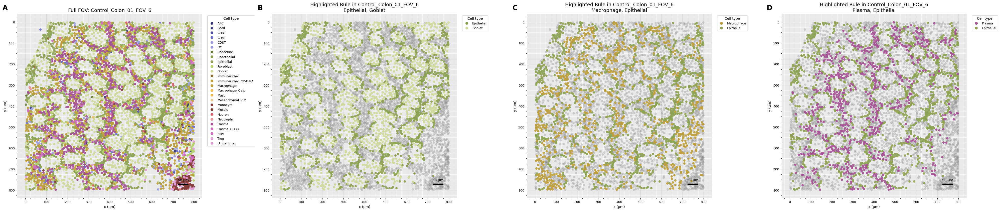

In [51]:
TARGET_FOV = 'Control_Colon_01_FOV_6'  
print_fov_metadata(TARGET_FOV)

TARGET_CELLS_1 = ['Epithelial', 'Goblet']
TARGET_CELLS_2 = ['Macrophage', 'Epithelial']
TARGET_CELLS_3 = ['Plasma', 'Epithelial']

plot_fov_plus_rule_fovs(TARGET_FOV, [TARGET_CELLS_1, TARGET_CELLS_2, TARGET_CELLS_3])

### Highlight Specific Rules

#### {Epithelial -> Goblet} Rule

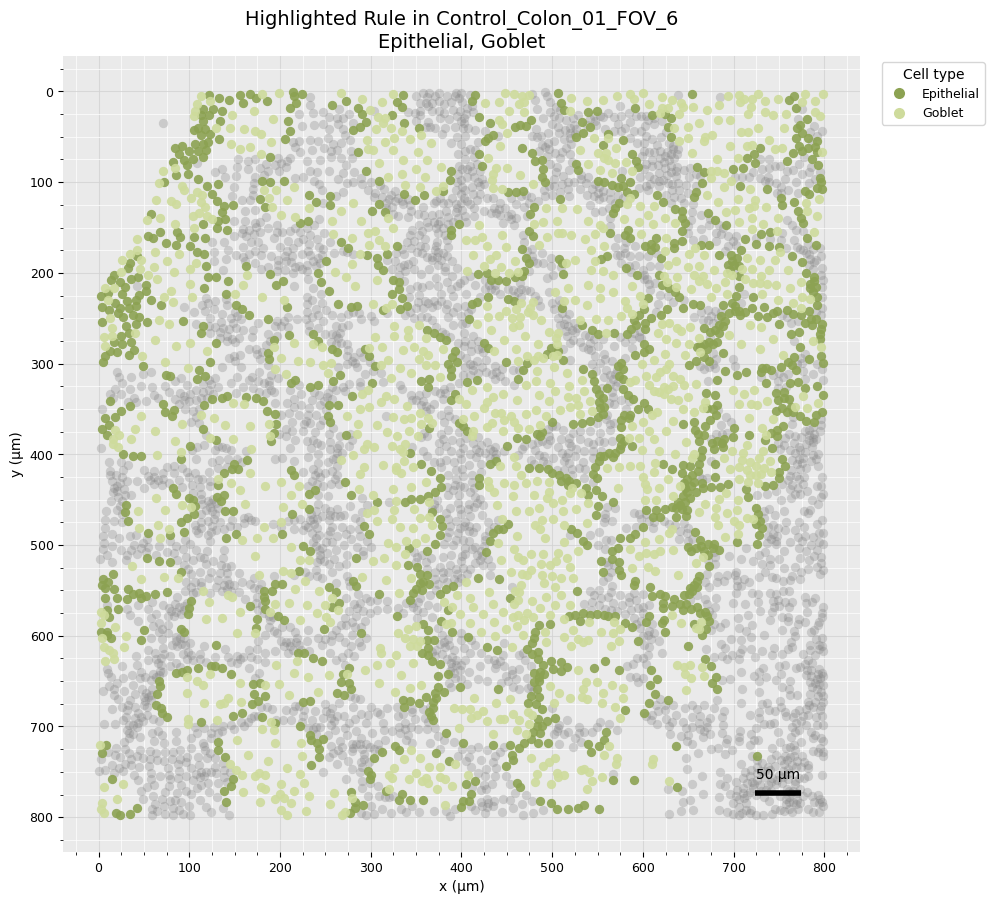

=== === === === === === === === === === === === === === === === === === === === 


=== Cell counts in FOV Control_Colon_01_FOV_6: ===
  Epithelial: 1172
  Goblet: 1124
All cell counts: 5271


=== === === === === === === === === === === === === === === === === === === === 


Result for binary fpgrowth:

--- Metrics for Epithelial -> Goblet ---
Metrics for Rule:
Support   : 0.2194
Confidence: 0.9569
Lift      : 1.3688
Conviction: 6.9760
FDR       : 0.0013
Rule Count (Global): 232
--- Metrics for Goblet -> Epithelial ---
     No rule found for this cell pair in the specified FOV.
No rule found for Goblet -> Epithelial in FOV Control_Colon_01_FOV_6. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********


=== === === === === === === === === === === === === === === === === === === === 


Result for weighted fpgrowth:

--- Metrics for Epithelial -> Goblet ---
Metrics for Rule:
Support   : 0.1970
Confidence: 0.8591
Lift      : 1.4665
Conviction: 2.9387


In [52]:
TARGET_CELLS = ['Epithelial', 'Goblet']

show_rule(TARGET_CELLS[0], TARGET_CELLS[1], TARGET_FOV)

### {Macrophage -> Epithelial} Rule

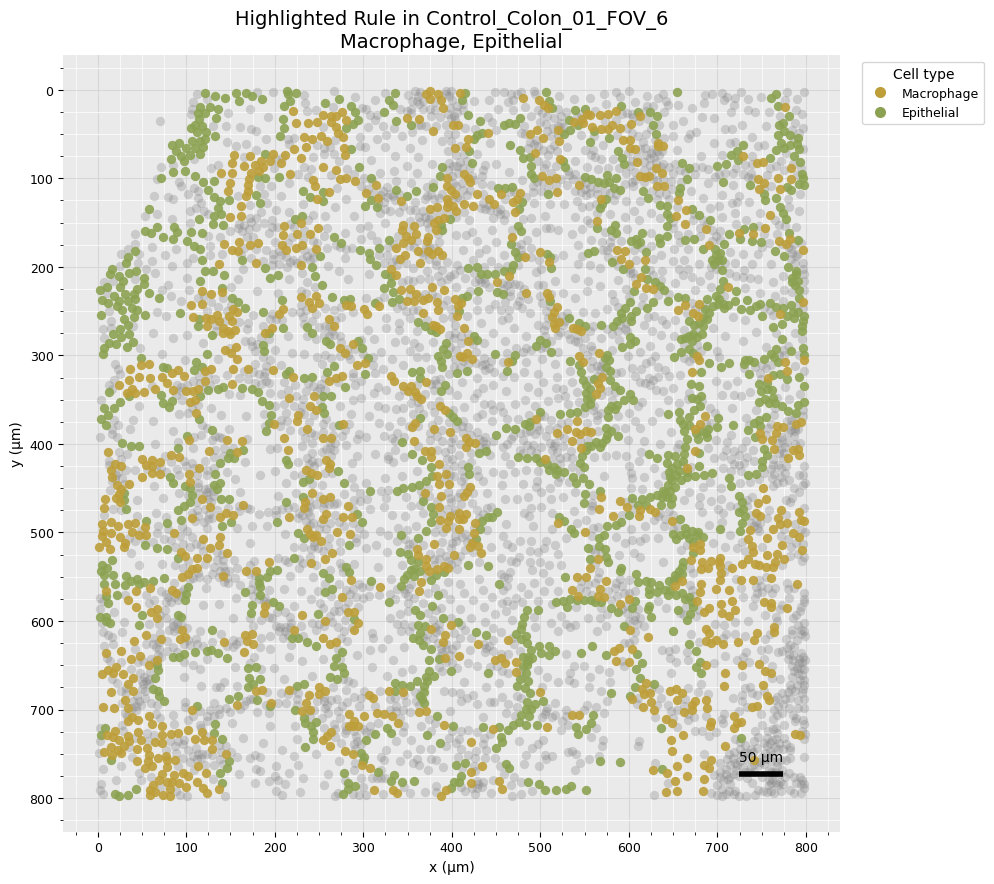

=== === === === === === === === === === === === === === === === === === === === 


=== Cell counts in FOV Control_Colon_01_FOV_6: ===
  Macrophage: 933
  Epithelial: 1172
All cell counts: 5271


=== === === === === === === === === === === === === === === === === === === === 


Result for binary fpgrowth:

--- Metrics for Macrophage -> Epithelial ---
     No rule found for this cell pair in the specified FOV.
No rule found for Macrophage -> Epithelial in FOV Control_Colon_01_FOV_6. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********
--- Metrics for Epithelial -> Macrophage ---
     No rule found for this cell pair in the specified FOV.
No rule found for Epithelial -> Macrophage in FOV Control_Colon_01_FOV_6. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********


=== === === === === === === === === === === === === === === === === === === === 


Result for weighted fpgrowth:

--- Metrics for Macrophage ->

In [53]:
show_rule(TARGET_CELLS_2[0], TARGET_CELLS_2[1], TARGET_FOV)

#### {Plasma -> Epithelial} Rule

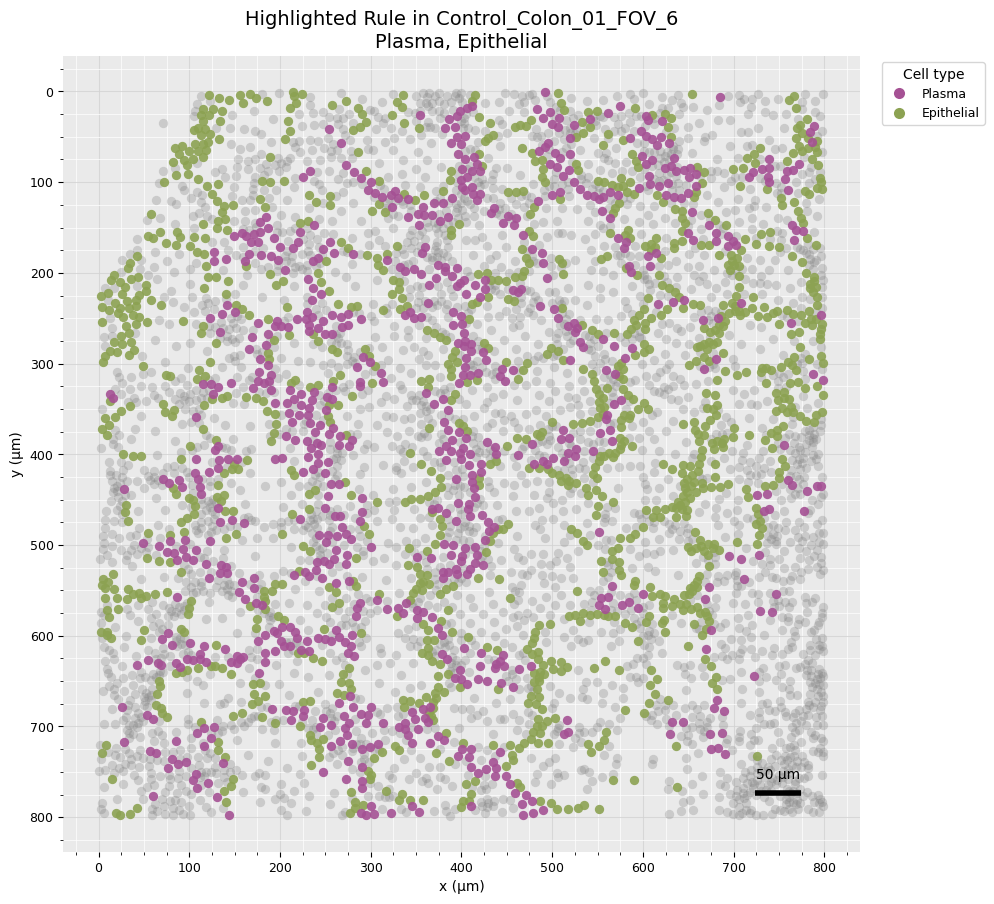

=== === === === === === === === === === === === === === === === === === === === 


=== Cell counts in FOV Control_Colon_01_FOV_6: ===
  Plasma: 770
  Epithelial: 1172
All cell counts: 5271


=== === === === === === === === === === === === === === === === === === === === 


Result for binary fpgrowth:

--- Metrics for Plasma -> Epithelial ---
     No rule found for this cell pair in the specified FOV.
No rule found for Plasma -> Epithelial in FOV Control_Colon_01_FOV_6. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********
--- Metrics for Epithelial -> Plasma ---
     No rule found for this cell pair in the specified FOV.
No rule found for Epithelial -> Plasma in FOV Control_Colon_01_FOV_6. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********


=== === === === === === === === === === === === === === === === === === === === 


Result for weighted fpgrowth:

--- Metrics for Plasma -> Epithelial ---
     No 

In [54]:
show_rule(TARGET_CELLS_3[0], TARGET_CELLS_3[1], TARGET_FOV)

## Full FOV Visualization - Control_01_FOV_1


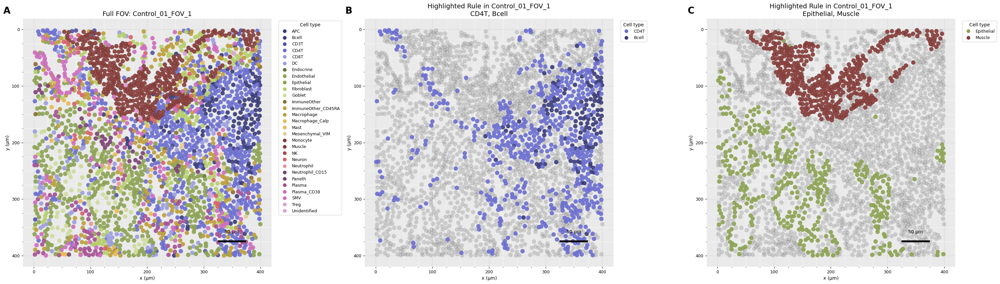

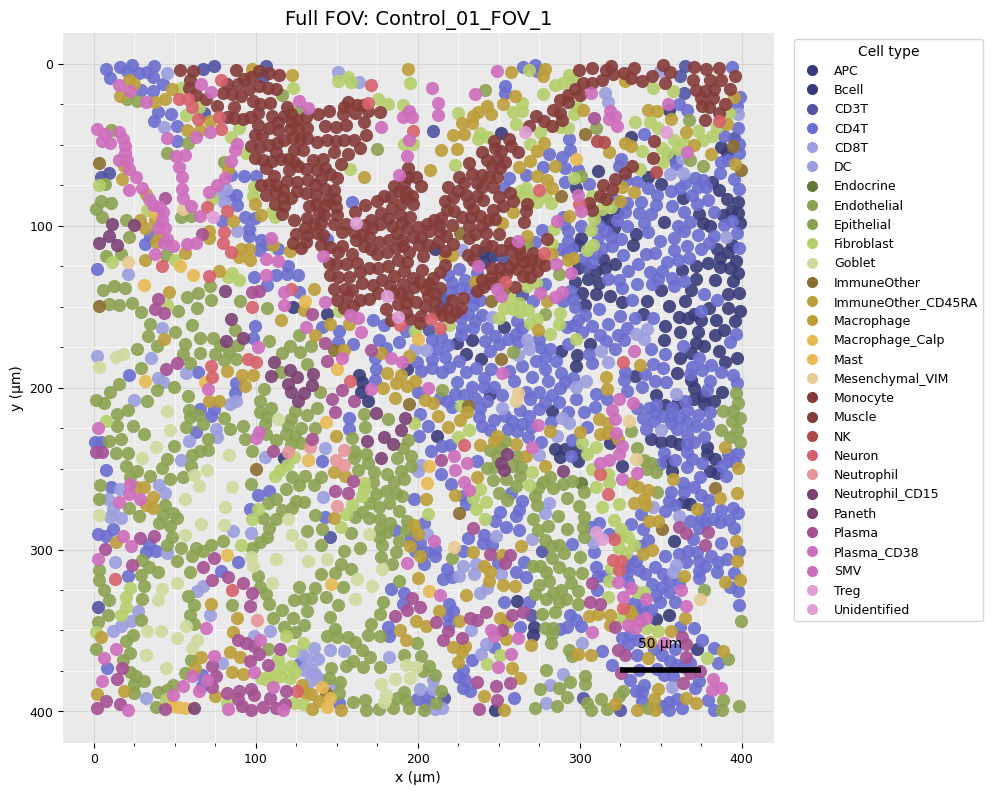

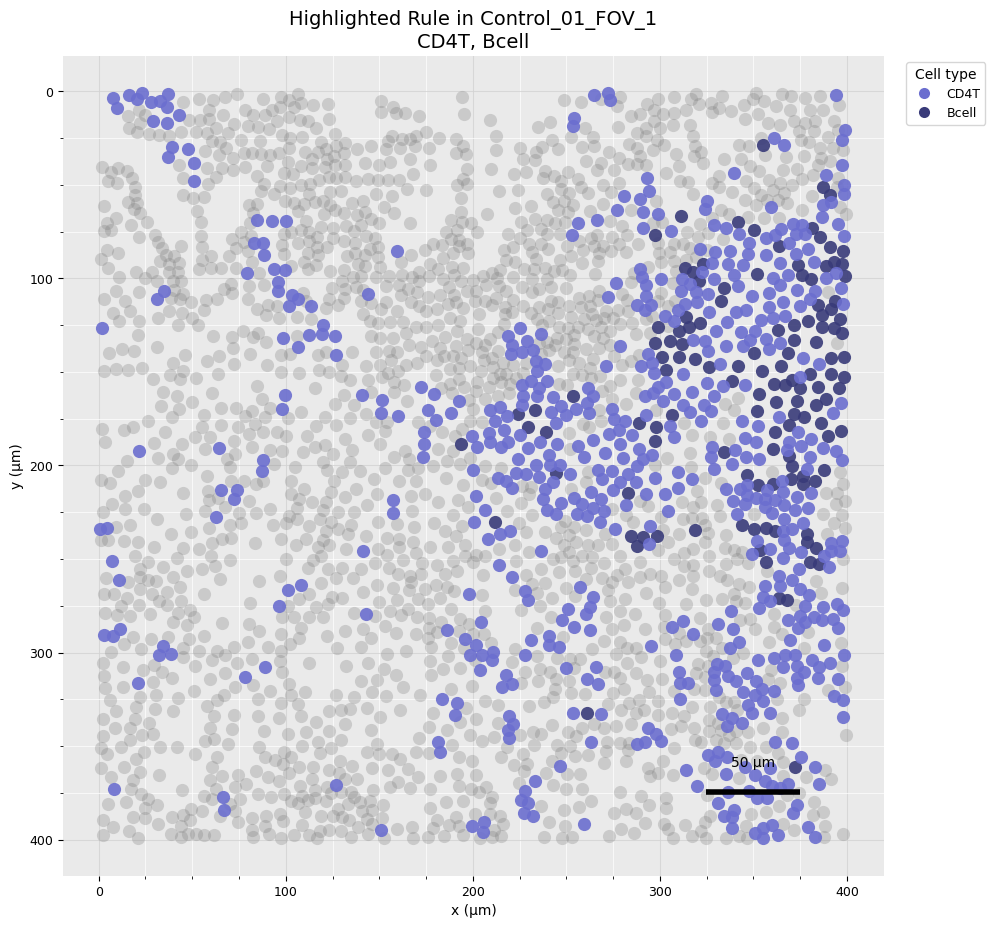

=== === === === === === === === === === === === === === === === === === === === 


=== Cell counts in FOV Control_01_FOV_1: ===
  CD4T: 588
  Bcell: 127
All cell counts: 2618


=== === === === === === === === === === === === === === === === === === === === 


Result for binary fpgrowth:

--- Metrics for CD4T -> Bcell ---
Metrics for Rule:
Support   : 0.1365
Confidence: 0.5809
Lift      : 1.8011
Conviction: 1.6166
FDR       : 0.0015
Rule Count (Global): 5
--- Metrics for Bcell -> CD4T ---
     No rule found for this cell pair in the specified FOV.
No rule found for Bcell -> CD4T in FOV Control_01_FOV_1. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********


=== === === === === === === === === === === === === === === === === === === === 


Result for weighted fpgrowth:

--- Metrics for CD4T -> Bcell ---
Metrics for Rule:
Support   : 0.1222
Confidence: 0.5200
Lift      : 1.9158
Conviction: 1.5180
FDR       : 0.0017
Rule Count (Global): 4
--- Metri

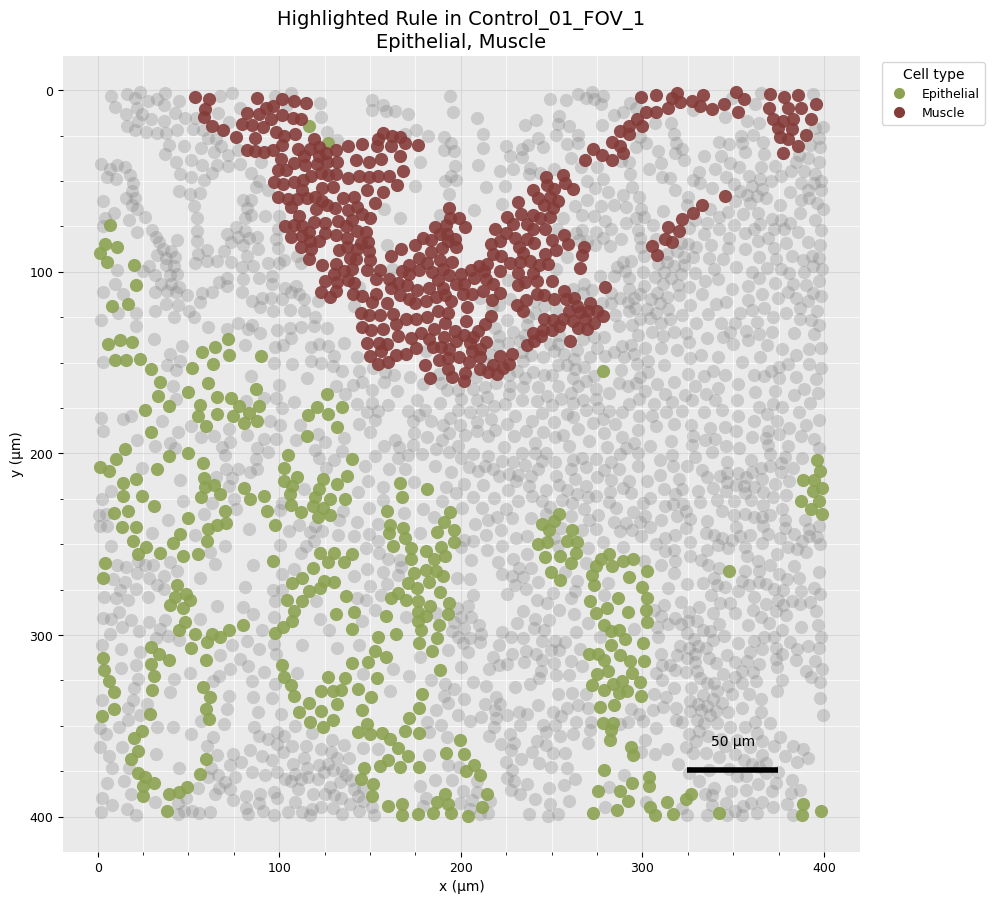

=== === === === === === === === === === === === === === === === === === === === 


=== Cell counts in FOV Control_01_FOV_1: ===
  Epithelial: 391
  Muscle: 415
All cell counts: 2618


=== === === === === === === === === === === === === === === === === === === === 


Result for binary fpgrowth:

--- Metrics for Epithelial -> Muscle ---
     No rule found for this cell pair in the specified FOV.
No rule found for Epithelial -> Muscle in FOV Control_01_FOV_1. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********
--- Metrics for Muscle -> Epithelial ---
Metrics for Rule:
Support   : 0.0116
Confidence: 0.0973
Lift      : 0.1992
Conviction: 0.5665
FDR       : 0.0015
Rule Count (Global): 45


=== === === === === === === === === === === === === === === === === === === === 


Result for weighted fpgrowth:

--- Metrics for Epithelial -> Muscle ---
Metrics for Rule:
Support   : 0.0010
Confidence: 0.0065
Lift      : 0.0234
Conviction: 0.7280
FDR       : 0.0

In [55]:
TARGET_FOV = "Control_01_FOV_1"


TARGET_CELLS_1 = ['CD4T', 'Bcell']
TARGET_CELLS_2 = ['Epithelial', 'Muscle']
plot_fov_plus_rule_fovs(TARGET_FOV, [TARGET_CELLS_1, TARGET_CELLS_2])
plot_fov(TARGET_FOV, df_cells, df_fovs, target_cells=None)
show_rule(TARGET_CELLS_1[0], TARGET_CELLS_1[1], TARGET_FOV)
show_rule(TARGET_CELLS_2[0], TARGET_CELLS_2[1], TARGET_FOV)

## Full FOV Visualization - Control_08_FOV_1

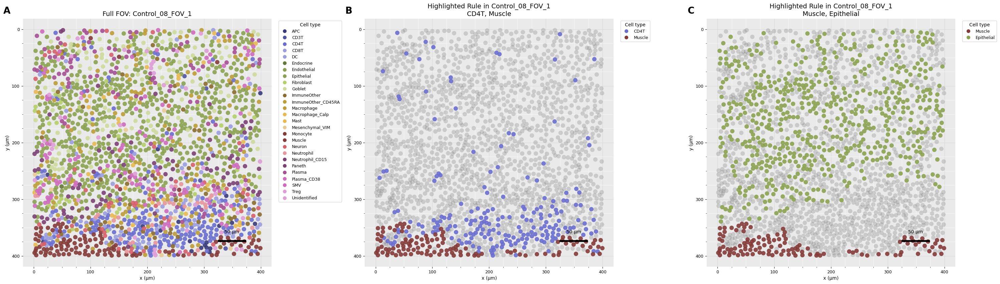

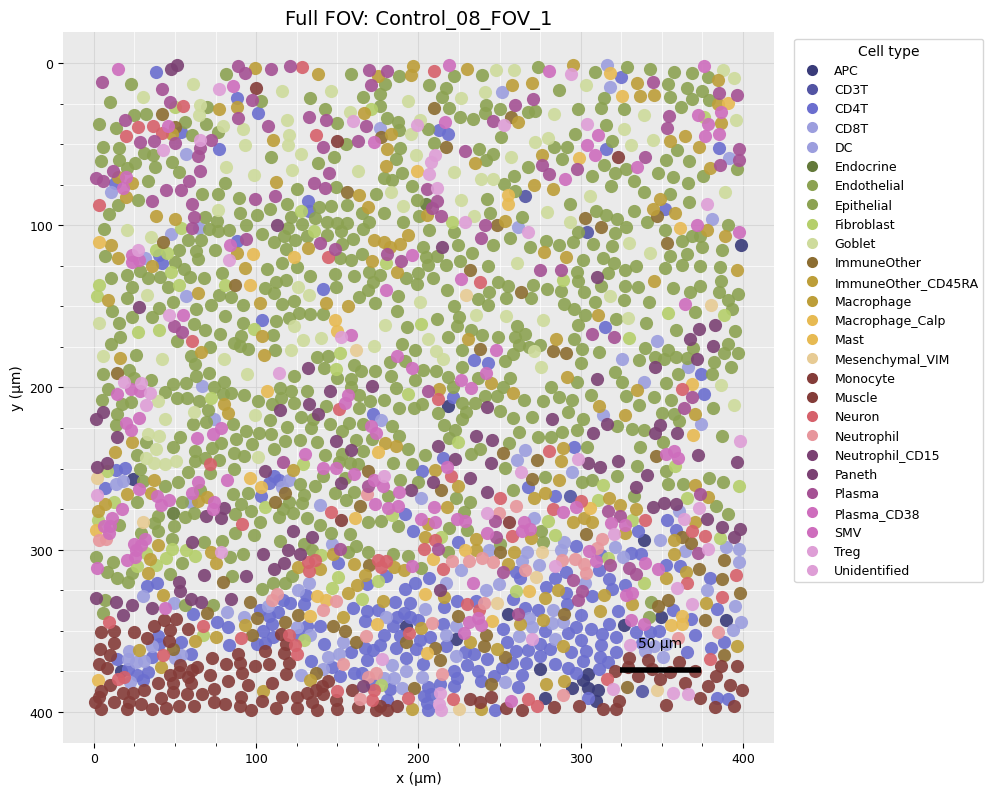

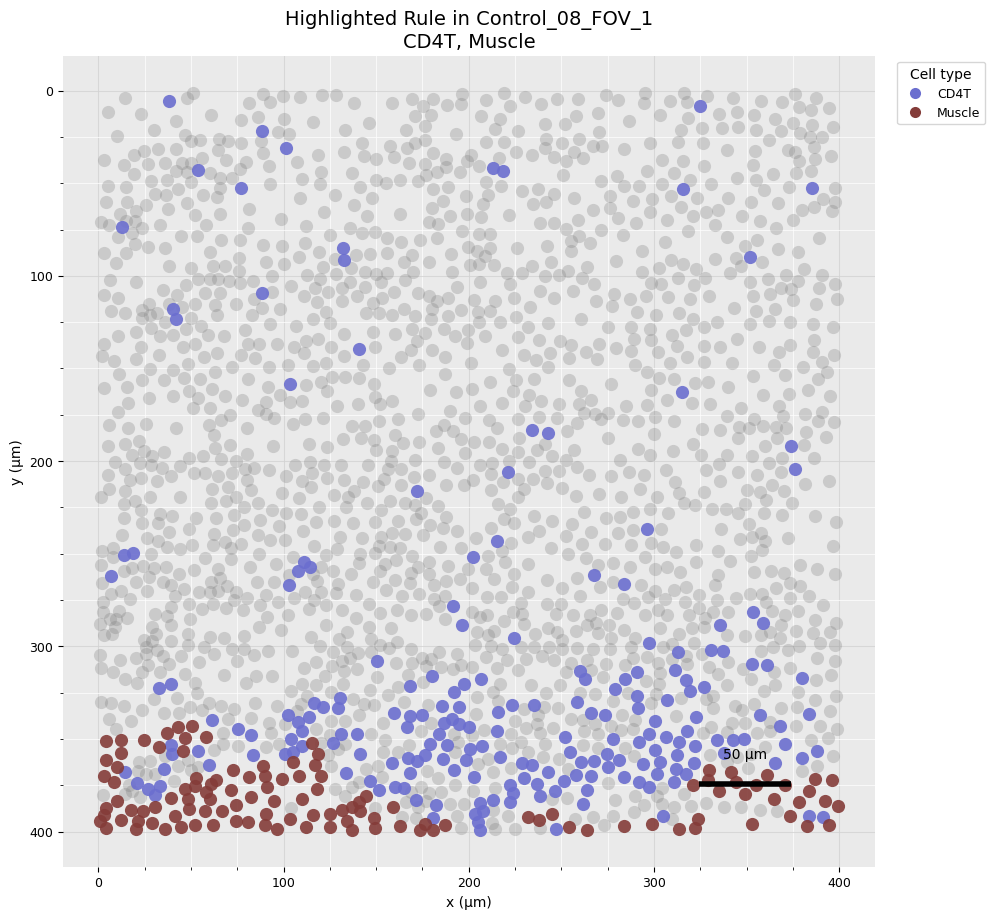

=== === === === === === === === === === === === === === === === === === === === 


=== Cell counts in FOV Control_08_FOV_1: ===
  CD4T: 205
  Muscle: 118
All cell counts: 1954


=== === === === === === === === === === === === === === === === === === === === 


Result for binary fpgrowth:

--- Metrics for CD4T -> Muscle ---
Metrics for Rule:
Support   : 0.0428
Confidence: 0.4049
Lift      : 2.5243
Conviction: 1.4108
FDR       : 0.0031
Rule Count (Global): 9
--- Metrics for Muscle -> CD4T ---
Metrics for Rule:
Support   : 0.0500
Confidence: 0.9327
Lift      : 1.4739
Conviction: 5.4555
FDR       : 0.0031
Rule Count (Global): 78


=== === === === === === === === === === === === === === === === === === === === 


Result for weighted fpgrowth:

--- Metrics for CD4T -> Muscle ---
     No rule found for this cell pair in the specified FOV.
No rule found for CD4T -> Muscle in FOV Control_08_FOV_1. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********
---

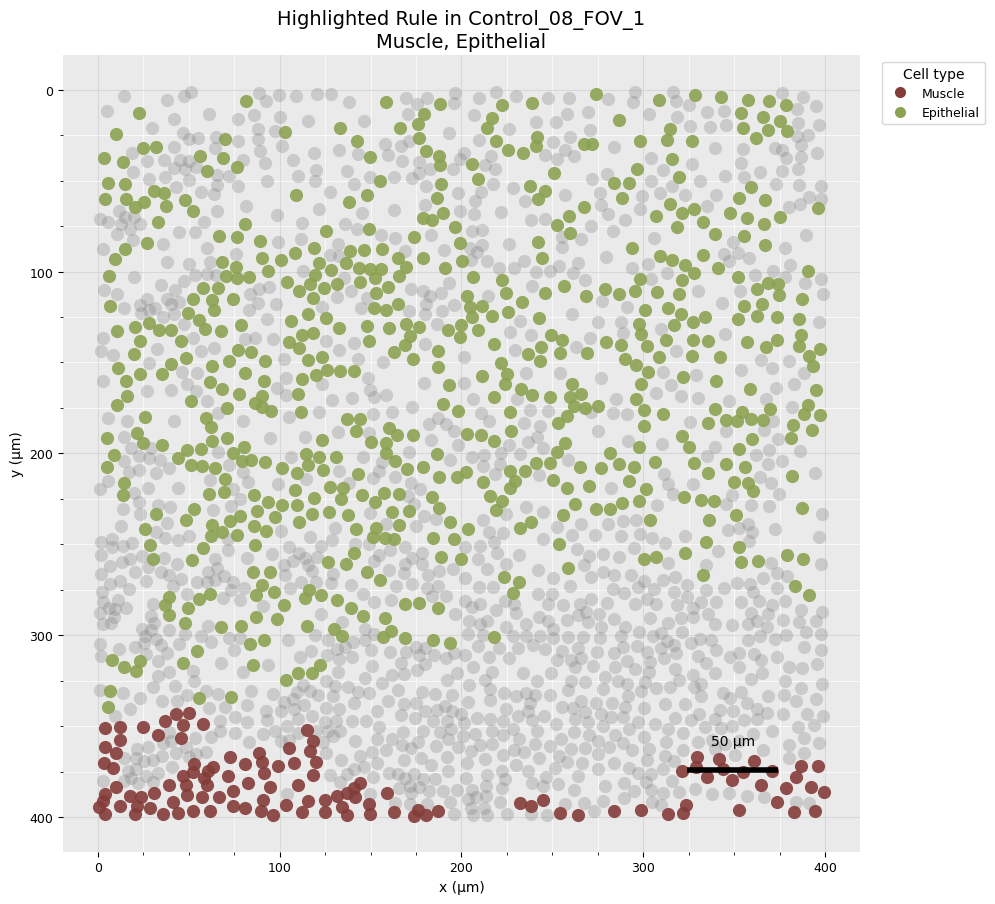

=== === === === === === === === === === === === === === === === === === === === 


=== Cell counts in FOV Control_08_FOV_1: ===
  Muscle: 118
  Epithelial: 593
All cell counts: 1954


=== === === === === === === === === === === === === === === === === === === === 


Result for binary fpgrowth:

--- Metrics for Muscle -> Epithelial ---
     No rule found for this cell pair in the specified FOV.
No rule found for Muscle -> Epithelial in FOV Control_08_FOV_1. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********
--- Metrics for Epithelial -> Muscle ---
     No rule found for this cell pair in the specified FOV.
No rule found for Epithelial -> Muscle in FOV Control_08_FOV_1. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********


=== === === === === === === === === === === === === === === === === === === === 


Result for weighted fpgrowth:

--- Metrics for Muscle -> Epithelial ---
Metrics for Rule:
Support  

In [56]:
TARGET_FOV = "Control_08_FOV_1"

TARGET_CELLS_1 = ['CD4T', 'Muscle']
TARGET_CELLS_2 = ['Muscle', 'Epithelial']
plot_fov_plus_rule_fovs(TARGET_FOV, [TARGET_CELLS_1, TARGET_CELLS_2])     
plot_fov(TARGET_FOV, df_cells, df_fovs, target_cells=None)

show_rule(TARGET_CELLS_1[0], TARGET_CELLS_1[1], TARGET_FOV)
show_rule(TARGET_CELLS_2[0], TARGET_CELLS_2[1], TARGET_FOV)

### GVHD_49_FOV_1

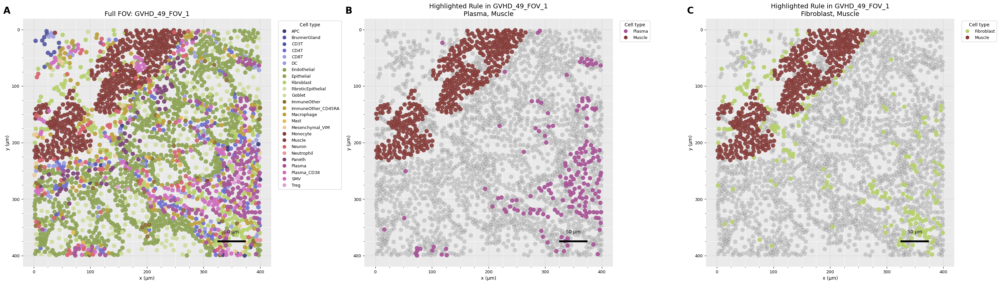

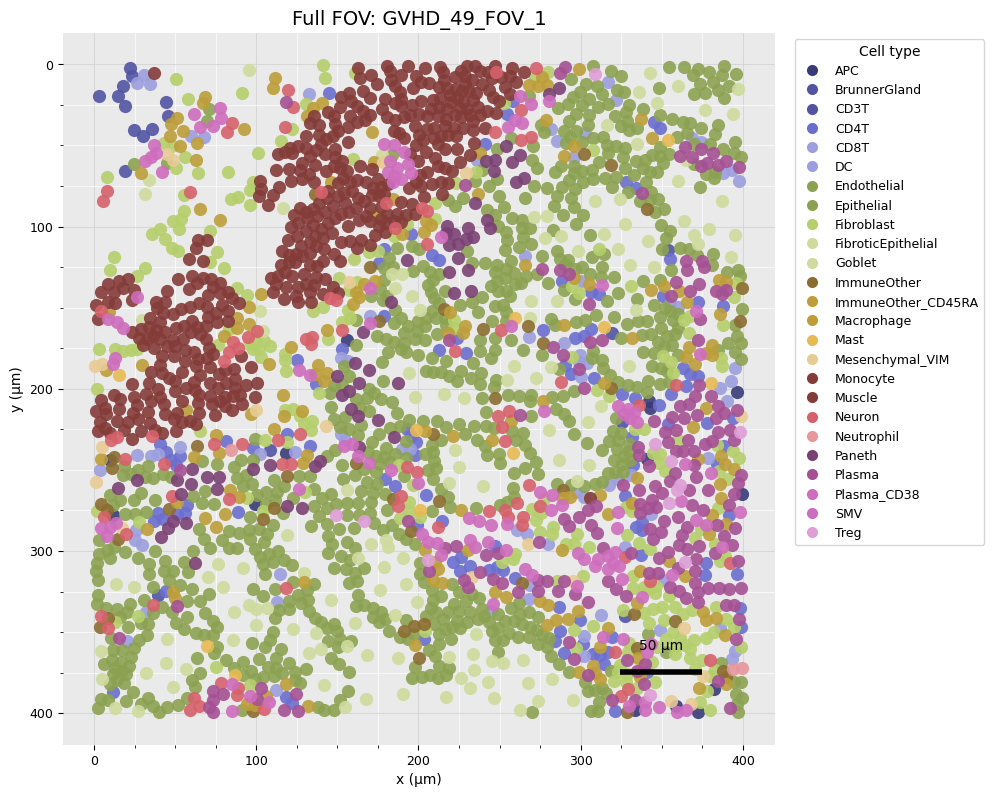

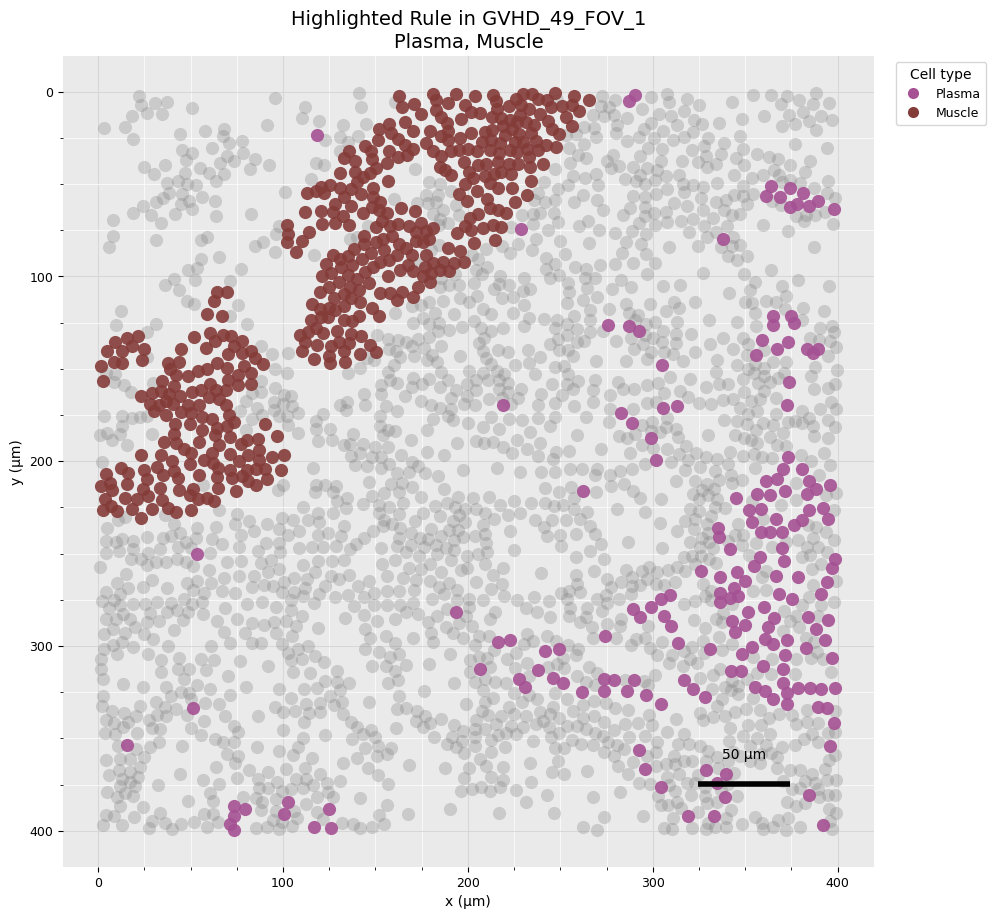

=== === === === === === === === === === === === === === === === === === === === 


=== Cell counts in FOV GVHD_49_FOV_1: ===
  Plasma: 182
  Muscle: 446
All cell counts: 2531


=== === === === === === === === === === === === === === === === === === === === 


Result for binary fpgrowth:

--- Metrics for Plasma -> Muscle ---
     No rule found for this cell pair in the specified FOV.
No rule found for Plasma -> Muscle in FOV GVHD_49_FOV_1. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********
--- Metrics for Muscle -> Plasma ---
     No rule found for this cell pair in the specified FOV.
No rule found for Muscle -> Plasma in FOV GVHD_49_FOV_1. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********


=== === === === === === === === === === === === === === === === === === === === 


Result for weighted fpgrowth:

--- Metrics for Plasma -> Muscle ---
Metrics for Rule:
Support   : 0.0011
Confidence: 0.0144
Lift

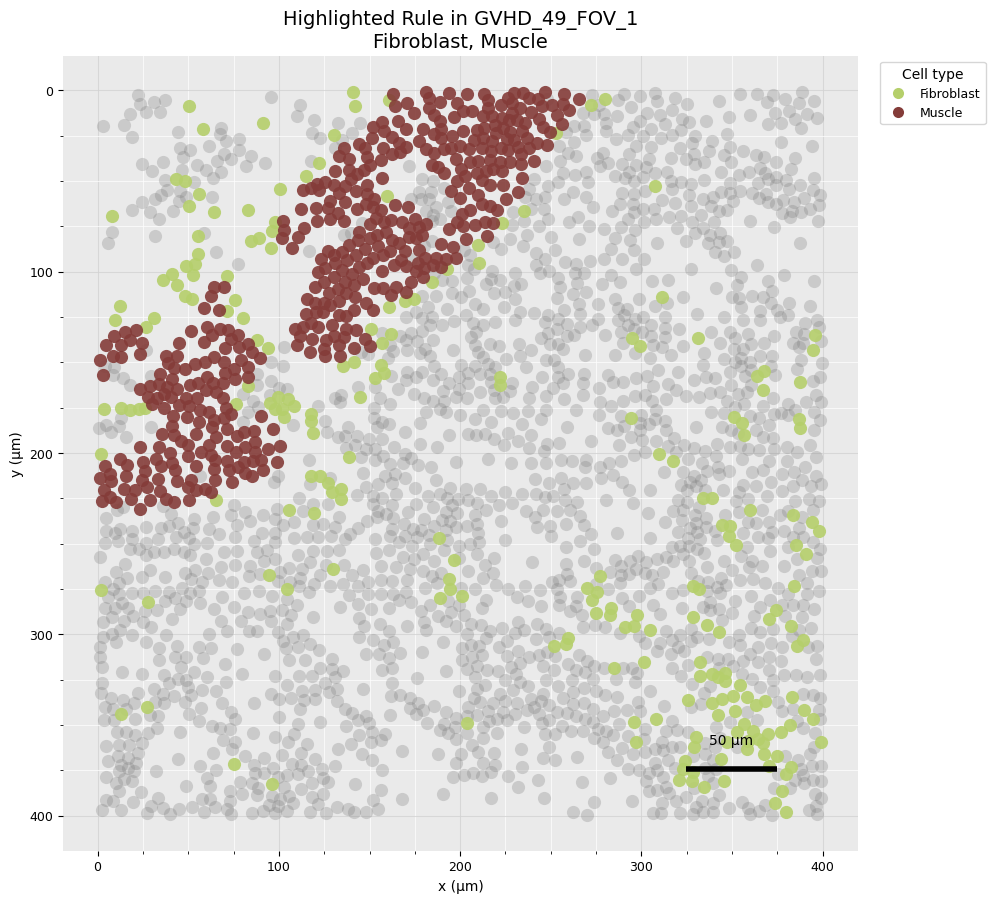

=== === === === === === === === === === === === === === === === === === === === 


=== Cell counts in FOV GVHD_49_FOV_1: ===
  Fibroblast: 220
  Muscle: 446
All cell counts: 2531


=== === === === === === === === === === === === === === === === === === === === 


Result for binary fpgrowth:

--- Metrics for Fibroblast -> Muscle ---
     No rule found for this cell pair in the specified FOV.
No rule found for Fibroblast -> Muscle in FOV GVHD_49_FOV_1. Checking raw results...
     No rule found for this cell pair in the specified FOV.
**********
--- Metrics for Muscle -> Fibroblast ---
Metrics for Rule:
Support   : 0.1031
Confidence: 0.8648
Lift      : 1.2159
Conviction: 2.1356
FDR       : 0.0015
Rule Count (Global): 77


=== === === === === === === === === === === === === === === === === === === === 


Result for weighted fpgrowth:

--- Metrics for Fibroblast -> Muscle ---
     No rule found for this cell pair in the specified FOV.
No rule found for Fibroblast -> Muscle in FOV GVHD_49_F

In [57]:
TARGET_FOV = "GVHD_49_FOV_1"

TARGET_CELLS_1 = ['Plasma', 'Muscle']
TARGET_CELLS_2 = ['Fibroblast', 'Muscle']
plot_fov_plus_rule_fovs(TARGET_FOV, [TARGET_CELLS_1, TARGET_CELLS_2])     
plot_fov(TARGET_FOV, df_cells, df_fovs, target_cells=None)

show_rule(TARGET_CELLS_1[0], TARGET_CELLS_1[1], TARGET_FOV)
show_rule(TARGET_CELLS_2[0], TARGET_CELLS_2[1], TARGET_FOV)